In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score
stats_out = {
    "Expert Threshold": [],
    "macro_mean": [],
    "macro_std": [],
    "weighted_mean": [],
    "weighted_std": []
}

# 20%

In [2]:
# Encode target data
from Text2Tags.classification_encoding import EncodedData
expert_threshold = 0.2
df = pd.read_csv(f"./data/expert_classifications.csv")
enc = EncodedData(
    df,
    agreement = expert_threshold,
    weighting = "custom_domain_weighting"
)
df = enc.create_target_vectors()
enc

EncodedData(df=      user_id  subject_ids                                        annotations  \
0      342263     71286998                                             Single   
1      342263     71286999      Single,Diffuse,C-shaped,Wide-angle tail (WAT)   
2      342263     71287000  Triple,Wide-angle tail (WAT),Narrow-angle tail...   
3      342263     71287001  Triple,Bent tail,Fanaroff and Riley Class 1 (F...   
4      342263     71287002                             Odd Radio Circle (ORC)   
...       ...          ...                                                ...   
1176  2424305     71287292                                             Single   
1177  2424305     71287293                                 Bent tail,Core-jet   
1178  2424305     71287294                             C-shaped,Core-dominant   
1179  2424305     71287295                                             Double   
1180  2424305     71287296                 Star Forming Galaxy (SFG),X-shaped   

      classi

In [3]:
# Initialise random number generator
rng = np.random.default_rng(seed=42)

# Simulate random guessing with optimal per class weighting:
thresholds = 1-df.onehot.sum()/df.shape[0]
random_predictions = np.where(rng.random((5000, df.shape[0], 22))>thresholds, 1, 0)

# Format targets
y = np.concatenate(df.onehot.values).reshape(df.shape[0], -1)

In [4]:
# Evaluate predictions
f1_macros = np.stack([f1_score(X, y, average='macro') for X in random_predictions])
f1_weighteds = np.stack([f1_score(X, y, average='weighted') for X in random_predictions])

/home/mbowles/Documents/language/Text2Tag/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1592: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))
/home/mbowles/Documents/language/Text2Tag/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1592: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))
/home/mbowles/Documents/language/Text2Tag/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1592: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior

Text(27.125, 0.5, 'Weighted F1-Score')

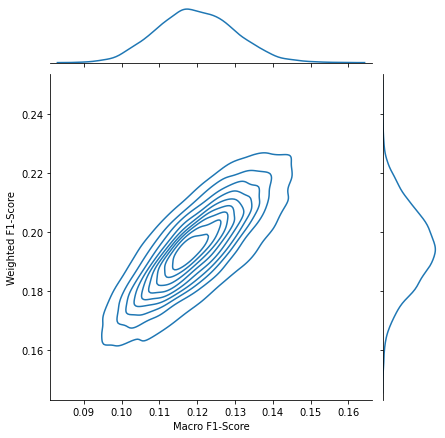

In [5]:
# Show the joint distribution using kernel density estimation
import seaborn as sns
g = sns.jointplot(
    x=f1_macros, y=f1_weighteds,
    kind="kde",
)
g.ax_joint.set_xlabel('Macro F1-Score')
g.ax_joint.set_ylabel('Weighted F1-Score')

In [6]:
stats_out["Expert Threshold"].append(expert_threshold)
stats_out["macro_mean"].append(f1_macros.mean().round(3))
stats_out["macro_std"].append(f1_macros.std().round(3))
stats_out["weighted_mean"].append(f1_weighteds.mean().round(3))
stats_out["weighted_std"].append(f1_weighteds.std().round(3))
stats_out

{'Expert Threshold': [0.2],
 'macro_mean': [0.12],
 'macro_std': [0.01],
 'weighted_mean': [0.195],
 'weighted_std': [0.013]}

# 40%

In [7]:
# Encode target data
from Text2Tags.classification_encoding import EncodedData
expert_threshold = 0.4
df = pd.read_csv(f"./data/expert_classifications.csv")
enc = EncodedData(
    df,
    agreement = expert_threshold,
    weighting = "custom_domain_weighting"
)
df = enc.create_target_vectors()
enc

EncodedData(df=      user_id  subject_ids                                        annotations  \
0      342263     71286998                                             Single   
1      342263     71286999      Single,Diffuse,C-shaped,Wide-angle tail (WAT)   
2      342263     71287000  Triple,Wide-angle tail (WAT),Narrow-angle tail...   
3      342263     71287001  Triple,Bent tail,Fanaroff and Riley Class 1 (F...   
4      342263     71287002                             Odd Radio Circle (ORC)   
...       ...          ...                                                ...   
1176  2424305     71287292                                             Single   
1177  2424305     71287293                                 Bent tail,Core-jet   
1178  2424305     71287294                             C-shaped,Core-dominant   
1179  2424305     71287295                                             Double   
1180  2424305     71287296                 Star Forming Galaxy (SFG),X-shaped   

      classi

In [8]:
# Initialise random number generator
rng = np.random.default_rng(seed=42)

# Simulate random guessing with optimal per class weighting:
thresholds = 1-df.onehot.sum()/df.shape[0]
random_predictions = np.where(rng.random((5000, df.shape[0], 22))>thresholds, 1, 0)

# Format targets
y = np.concatenate(df.onehot.values).reshape(df.shape[0], -1)

In [9]:
# Evaluate predictions
f1_macros = np.stack([f1_score(X, y, average='macro') for X in random_predictions])
f1_weighteds = np.stack([f1_score(X, y, average='weighted') for X in random_predictions])

/home/mbowles/Documents/language/Text2Tag/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1592: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))
/home/mbowles/Documents/language/Text2Tag/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1592: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))
/home/mbowles/Documents/language/Text2Tag/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1592: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior

Text(27.125, 0.5, 'Weighted F1-Score')

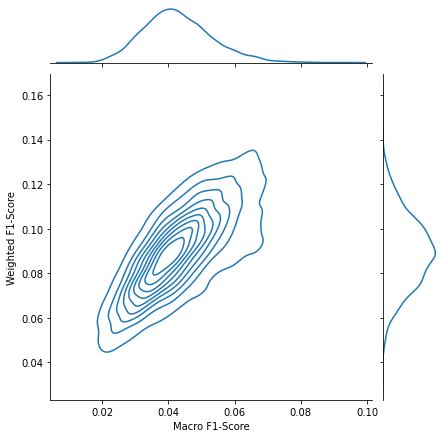

In [10]:
# Show the joint distribution using kernel density estimation
import seaborn as sns
g = sns.jointplot(
    x=f1_macros, y=f1_weighteds,
    kind="kde",
)
g.ax_joint.set_xlabel('Macro F1-Score')
g.ax_joint.set_ylabel('Weighted F1-Score')

In [11]:
stats_out["Expert Threshold"].append(expert_threshold)
stats_out["macro_mean"].append(f1_macros.mean().round(3))
stats_out["macro_std"].append(f1_macros.std().round(3))
stats_out["weighted_mean"].append(f1_weighteds.mean().round(3))
stats_out["weighted_std"].append(f1_weighteds.std().round(3))
stats_out

{'Expert Threshold': [0.2, 0.4],
 'macro_mean': [0.12, 0.043],
 'macro_std': [0.01, 0.01],
 'weighted_mean': [0.195, 0.09],
 'weighted_std': [0.013, 0.016]}

# 60%

In [12]:
# Encode target data
from Text2Tags.classification_encoding import EncodedData
expert_threshold = 0.6
df = pd.read_csv(f"./data/expert_classifications.csv")
enc = EncodedData(
    df,
    agreement = expert_threshold,
    weighting = "custom_domain_weighting"
)
df = enc.create_target_vectors()
enc

EncodedData(df=      user_id  subject_ids                                        annotations  \
0      342263     71286998                                             Single   
1      342263     71286999      Single,Diffuse,C-shaped,Wide-angle tail (WAT)   
2      342263     71287000  Triple,Wide-angle tail (WAT),Narrow-angle tail...   
3      342263     71287001  Triple,Bent tail,Fanaroff and Riley Class 1 (F...   
4      342263     71287002                             Odd Radio Circle (ORC)   
...       ...          ...                                                ...   
1176  2424305     71287292                                             Single   
1177  2424305     71287293                                 Bent tail,Core-jet   
1178  2424305     71287294                             C-shaped,Core-dominant   
1179  2424305     71287295                                             Double   
1180  2424305     71287296                 Star Forming Galaxy (SFG),X-shaped   

      classi

In [13]:
# Initialise random number generator
rng = np.random.default_rng(seed=42)

# Simulate random guessing with optimal per class weighting:
thresholds = 1-df.onehot.sum()/df.shape[0]
random_predictions = np.where(rng.random((5000, df.shape[0], 22))>thresholds, 1, 0)

# Format targets
y = np.concatenate(df.onehot.values).reshape(df.shape[0], -1)

In [14]:
# Evaluate predictions
f1_macros = np.stack([f1_score(X, y, average='macro') for X in random_predictions])
f1_weighteds = np.stack([f1_score(X, y, average='weighted') for X in random_predictions])

/home/mbowles/Documents/language/Text2Tag/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1592: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))
/home/mbowles/Documents/language/Text2Tag/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1592: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))
/home/mbowles/Documents/language/Text2Tag/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1592: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior

Text(27.125, 0.5, 'Weighted F1-Score')

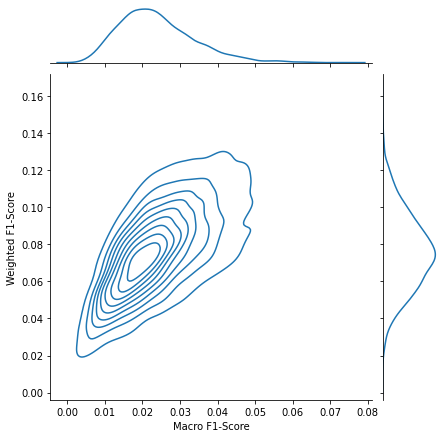

In [15]:
# Show the joint distribution using kernel density estimation
import seaborn as sns
g = sns.jointplot(
    x=f1_macros, y=f1_weighteds,
    kind="kde",
)
g.ax_joint.set_xlabel('Macro F1-Score')
g.ax_joint.set_ylabel('Weighted F1-Score')

In [16]:
stats_out["Expert Threshold"].append(expert_threshold)
stats_out["macro_mean"].append(f1_macros.mean().round(3))
stats_out["macro_std"].append(f1_macros.std().round(3))
stats_out["weighted_mean"].append(f1_weighteds.mean().round(3))
stats_out["weighted_std"].append(f1_weighteds.std().round(3))
stats_out

{'Expert Threshold': [0.2, 0.4, 0.6],
 'macro_mean': [0.12, 0.043, 0.024],
 'macro_std': [0.01, 0.01, 0.01],
 'weighted_mean': [0.195, 0.09, 0.076],
 'weighted_std': [0.013, 0.016, 0.021]}

# 80%

In [18]:
# Encode target data
from Text2Tags.classification_encoding import EncodedData
expert_threshold = 0.8
df = pd.read_csv(f"./data/expert_classifications.csv")
enc = EncodedData(
    df,
    agreement = expert_threshold,
    weighting = "custom_domain_weighting"
)
df = enc.create_target_vectors()
enc

EncodedData(df=      user_id  subject_ids                                        annotations  \
0      342263     71286998                                             Single   
1      342263     71286999      Single,Diffuse,C-shaped,Wide-angle tail (WAT)   
2      342263     71287000  Triple,Wide-angle tail (WAT),Narrow-angle tail...   
3      342263     71287001  Triple,Bent tail,Fanaroff and Riley Class 1 (F...   
4      342263     71287002                             Odd Radio Circle (ORC)   
...       ...          ...                                                ...   
1176  2424305     71287292                                             Single   
1177  2424305     71287293                                 Bent tail,Core-jet   
1178  2424305     71287294                             C-shaped,Core-dominant   
1179  2424305     71287295                                             Double   
1180  2424305     71287296                 Star Forming Galaxy (SFG),X-shaped   

      classi

In [19]:
# Initialise random number generator
rng = np.random.default_rng(seed=42)

# Simulate random guessing with optimal per class weighting:
thresholds = 1-df.onehot.sum()/df.shape[0]
random_predictions = np.where(rng.random((5000, df.shape[0], 22))>thresholds, 1, 0)

# Format targets
y = np.concatenate(df.onehot.values).reshape(df.shape[0], -1)

In [20]:
# Evaluate predictions
f1_macros = np.stack([f1_score(X, y, average='macro') for X in random_predictions])
f1_weighteds = np.stack([f1_score(X, y, average='weighted') for X in random_predictions])

/home/mbowles/Documents/language/Text2Tag/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1592: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))
/home/mbowles/Documents/language/Text2Tag/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1592: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))
/home/mbowles/Documents/language/Text2Tag/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1592: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior

Text(27.125, 0.5, 'Weighted F1-Score')

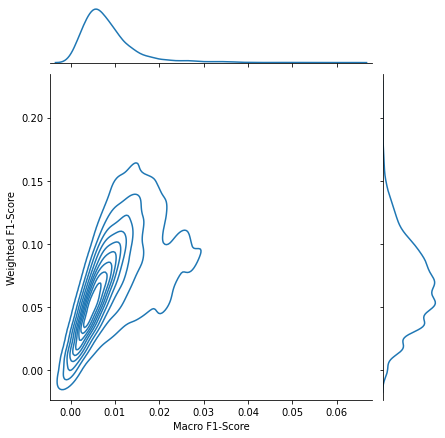

In [21]:
# Show the joint distribution using kernel density estimation
import seaborn as sns
g = sns.jointplot(
    x=f1_macros, y=f1_weighteds,
    kind="kde",
)
g.ax_joint.set_xlabel('Macro F1-Score')
g.ax_joint.set_ylabel('Weighted F1-Score')

In [22]:
stats_out["Expert Threshold"].append(expert_threshold)
stats_out["macro_mean"].append(f1_macros.mean().round(3))
stats_out["macro_std"].append(f1_macros.std().round(3))
stats_out["weighted_mean"].append(f1_weighteds.mean().round(3))
stats_out["weighted_std"].append(f1_weighteds.std().round(3))
stats_out

{'Expert Threshold': [0.2, 0.4, 0.6, 0.8],
 'macro_mean': [0.12, 0.043, 0.024, 0.009],
 'macro_std': [0.01, 0.01, 0.01, 0.006],
 'weighted_mean': [0.195, 0.09, 0.076, 0.069],
 'weighted_std': [0.013, 0.016, 0.021, 0.033]}

In [24]:
df = pd.DataFrame(stats_out)
df

,Expert Threshold,macro_mean,macro_std,weighted_mean,weighted_std
0,0.2,0.120,0.010,0.195,0.013
1,0.4,0.043,0.010,0.090,0.016
2,0.6,0.024,0.010,0.076,0.021
3,0.8,0.009,0.006,0.069,0.033
